<a href="https://colab.research.google.com/github/ali-workshop/Fruit-Detection-YOLO11-YOLO8-FasterRCNN/blob/main/Fruit_Object_Detection_using_Yolov10_%2CYolo11_%2CFasterRCNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Fruit Object Detection using  Yolov10 ,Yolo11 ,FasterRCNN

##Download Libraries

In [1]:
from IPython import display
display.clear_output()
!pip install opendatasets
!pip install ultralytics==8.3.21
print("download  complete.....")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 877.1/877.1 kB 27.3 MB/s eta 0:00:00
download  complete.....


# import libraries

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import glob
import opendatasets as od
import torch
import torch.nn as nn
from torchvision import transforms, datasets
from PIL import Image, ImageDraw, ImageFont
from torch.utils.data import Dataset, DataLoader
from ultralytics import YOLO
from IPython import display
import random

print("Importing complete.....")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
importing  complete.....


# set and activate gpu

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

# download dataset frm url

In [4]:
od.download('https://www.kaggle.com/datasets/lakshaytyagi01/fruit-detection')
#my kaggle api: 6463b4d76523a3d511aadcdd9df378ec #replace it with yours

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: alolaa
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/lakshaytyagi01/fruit-detection


100%|██████████| 501M/501M [00:10<00:00, 48.7MB/s]


##define data directories

In [5]:
data = '/content/fruit-detection/Fruits-detection'
traindir    = os.path.join(data, 'train/images')
trainlabels = os.path.join(data,'train/labels')

valdir    = os.path.join(data,'valid/images')
vallabels = os.path.join(data,'valid/labels' )

## read and glop data files using custom files function

In [8]:
def files(images, labels):
    image_files = glob.glob(os.path.join(images, '*.jpg'))
    labels_files = glob.glob(os.path.join(labels, '*.txt'))

    return image_files, labels_files

In [9]:
train_image_files, train_labels_files = files(traindir, trainlabels)
val_image_files, val_labels_files = files(valdir, vallabels)

## sort files

In [10]:
train_image_files.sort()
train_labels_files.sort()
val_image_files.sort()
val_labels_files.sort()

#Define data loaded class

In [11]:
class dataset(Dataset):
    def __init__(self, image_paths, label_paths, transform=None, draw_box= False):
        self.image_paths = image_paths
        self.label_paths = label_paths
        self.transform = transform
        self.draw_box = draw_box

    def __getitem__(self, index):
        image_path = self.image_paths[index]
        label_path = self.label_paths[index]

        labels = []
        image = Image.open(image_path)
        image = image.resize((500, 500))
        draw = ImageDraw.Draw(image)

        classes = ['Apple', 'Banana', 'Grape', 'Orange', 'Pineapple', 'Watermelon']
        colors = ['yellow', 'red', 'pink', 'green', 'blue', 'orange']
        # Open the file and read its content
        with open(label_path, 'r') as file:
            lines = file.readlines()

        for line in lines:
            if line.strip():
                parts = line.strip().split()
                class_num = int(parts[0])
                x_center = float(parts[1])
                y_center = float(parts[2])
                width = float(parts[3])
                height = float(parts[4])

                x_min = int((x_center - width / 2) * 500)
                y_min = int((y_center - height / 2) * 500)
                x_max = int((x_center + width / 2) * 500)
                y_max = int((y_center + height / 2) * 500)

                labels.append((class_num, x_min, y_min, x_max, y_max))
                if self.draw_box == True:
                    draw.rectangle([x_min, y_min, x_max, y_max], outline= colors[class_num], width=10)
                    draw.text((x_min, y_min), f"{classes[class_num]}", fill= 'white')

        if self.transform:
            image = self.transform(image)

        return image, labels

    def __len__(self):
        return len(self.image_paths)


# lunch data loader

In [12]:
train_dataset = dataset(train_image_files, train_labels_files, None, True)
val_dataset = dataset(val_image_files, val_labels_files, None, False)

# Show some images with its labels and box

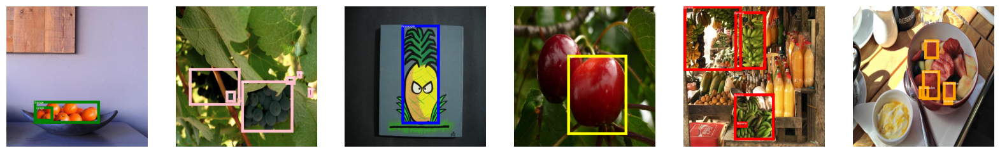

In [13]:
indxs = [603,160, 900, 20, 446, 80]
temp =0
fig, axes = plt.subplots(1, 6, figsize=(20, 10))
for i in indxs:
        image, labels = train_dataset[i]
        axes[temp].imshow(image)
        axes[temp].axis('off')
        temp = temp +1

plt.show()

# Training and validation

#start config an train with yolo8

In [14]:
model = YOLO('yolov8n.pt')

100%|██████████| 6.25M/6.25M [00:00<00:00, 93.7MB/s]


In [15]:
import yaml
from pathlib import Path
import wandb
wandb.init(mode='disabled')


data = {
    'train': "/content/fruit-detection/Fruits-detection/train",
    'val': "/content/fruit-detection/Fruits-detection/valid",
    'nc': 6,
    'names' :
        ['Apple',
         'Banana',
         'Grape',
         'Orange',
         'Pineapple',
         'Watermelon' ]
}

with open('data.yaml', 'w') as file:
    yaml.dump(data, file)

## start the trianing

In [19]:
yaml_path="/content/data.yaml"
model.train(data=yaml_path, imgsz=600, batch=32, epochs=20)

New https://pypi.org/project/ultralytics/8.3.24 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.21 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/data.yaml, epochs=20, time=None, patience=100, batch=32, imgsz=600, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, 

train: Scanning /content/fruit-detection/Fruits-detection/train/labels.cache... 7108 images, 0 backgrounds, 0 corrupt: 100%|██████████| 7108/7108 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/fruit-detection/Fruits-detection/train/images/3d8be4f881b8c54c_jpg.rf.0d7b6d095459cece040b47b246d807af.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/fruit-detection/Fruits-detection/train/images/3d8be4f881b8c54c_jpg.rf.64e869a9bedd5f012cc2a1129c6ca229.jpg: 1 duplicate labels removed
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/fruit-detection/Fruits-detection/valid/labels.cache... 914 images, 0 backgrounds, 0 corrupt: 100%|██████████| 914/914 [00:00<?, ?it/s]

val: WARNING ⚠️ /content/fruit-detection/Fruits-detection/valid/images/3d3ddc3054b32eb7_jpg.rf.03e7789aaf5212e2634b84ef502e0832.jpg: 1 duplicate labels removed


Plotting labels to runs/detect/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 608 train, 608 val
Using 2 dataloader workers
Logging results to runs/detect/train3
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      7.21G     0.7673     0.9123      1.088         24        608: 100%|██████████| 223/223 [02:35<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:17<00:00,  1.15s/it]


                   all        914       3227      0.573      0.419      0.434      0.276

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      5.39G     0.8169      1.032      1.127         19        608: 100%|██████████| 223/223 [02:29<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:12<00:00,  1.16it/s]

                   all        914       3227      0.489      0.378      0.382      0.242



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      6.09G      0.849       1.07      1.134         50        608: 100%|██████████| 223/223 [02:32<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:12<00:00,  1.20it/s]


                   all        914       3227      0.501      0.336      0.338      0.203

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      6.29G     0.8515      1.091      1.137         25        608: 100%|██████████| 223/223 [02:25<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:08<00:00,  1.68it/s]


                   all        914       3227      0.461      0.332      0.321       0.19

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      5.58G     0.8522      1.045      1.132         32        608: 100%|██████████| 223/223 [02:19<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:12<00:00,  1.18it/s]

                   all        914       3227      0.503      0.374      0.382      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20       5.5G     0.8318      1.023      1.125         40        608: 100%|██████████| 223/223 [02:41<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:15<00:00,  1.02s/it]


                   all        914       3227      0.496      0.398      0.378      0.233

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      5.58G     0.8147     0.9805      1.118         34        608: 100%|██████████| 223/223 [03:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:16<00:00,  1.09s/it]

                   all        914       3227      0.504      0.387      0.391      0.245



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      5.73G     0.8104     0.9663      1.111         22        608: 100%|██████████| 223/223 [02:41<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:10<00:00,  1.47it/s]


                   all        914       3227      0.542      0.404      0.418      0.263

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      5.85G     0.8037     0.9367      1.108         24        608: 100%|██████████| 223/223 [02:24<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:10<00:00,  1.40it/s]

                   all        914       3227      0.556      0.412      0.424      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      6.39G     0.7991     0.9277      1.102         17        608: 100%|██████████| 223/223 [02:21<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:08<00:00,  1.87it/s]

                   all        914       3227      0.547      0.426      0.431      0.269


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      5.83G     0.8226     0.8912       1.11          6        608: 100%|██████████| 223/223 [02:13<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:08<00:00,  1.67it/s]


                   all        914       3227      0.546      0.412      0.437      0.282

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      5.28G     0.8014     0.8345      1.095         20        608: 100%|██████████| 223/223 [02:10<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:07<00:00,  1.94it/s]

                   all        914       3227      0.575      0.392       0.43      0.277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      5.58G      0.787     0.8097      1.084         10        608: 100%|██████████| 223/223 [02:10<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:10<00:00,  1.49it/s]

                   all        914       3227      0.594      0.403       0.45      0.297



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      6.04G     0.7761     0.7777      1.074          9        608: 100%|██████████| 223/223 [02:08<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:10<00:00,  1.39it/s]

                   all        914       3227      0.549      0.428      0.445      0.295



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      4.62G     0.7608     0.7453      1.064         17        608: 100%|██████████| 223/223 [02:09<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:10<00:00,  1.46it/s]

                   all        914       3227      0.607      0.427      0.457      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20       5.4G      0.754     0.7191      1.062         34        608: 100%|██████████| 223/223 [02:08<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:08<00:00,  1.73it/s]

                   all        914       3227      0.584      0.442      0.474      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      5.22G     0.7436     0.6945      1.053         15        608: 100%|██████████| 223/223 [02:10<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:07<00:00,  1.90it/s]

                   all        914       3227      0.629      0.425      0.473      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      5.12G      0.731     0.6759      1.044          6        608: 100%|██████████| 223/223 [02:09<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:10<00:00,  1.42it/s]


                   all        914       3227      0.623      0.425      0.475      0.315

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      6.42G     0.7226     0.6607      1.043         27        608: 100%|██████████| 223/223 [02:06<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:09<00:00,  1.61it/s]

                   all        914       3227      0.606      0.443       0.48      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      6.04G     0.7076     0.6311      1.032         11        608: 100%|██████████| 223/223 [02:08<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:07<00:00,  1.90it/s]

                   all        914       3227      0.644      0.447      0.495      0.332



20 epochs completed in 0.856 hours.
Optimizer stripped from runs/detect/train3/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train3/weights/best.pt, 6.2MB

Validating runs/detect/train3/weights/best.pt...
Ultralytics 8.3.21 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,006,818 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:17<00:00,  1.17s/it]


                   all        914       3227      0.644      0.447      0.495      0.332
                 Apple        188        557      0.671      0.479      0.526      0.367
                Banana        167        390      0.677      0.441      0.493      0.286
                 Grape        199        809      0.568      0.366       0.39      0.255
                Orange        197       1100      0.617      0.385      0.438      0.276
             Pineapple         77        154       0.68      0.442      0.501      0.335
            Watermelon        107        217      0.653      0.567      0.624       0.47
Speed: 0.2ms preprocess, 2.5ms inference, 0.0ms loss, 4.7ms postprocess per image
Results saved to runs/detect/train3


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d2e3b423880>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
     

## yolo8 Evaluation

In [20]:
model.val(data='/content/data.yaml')

Ultralytics 8.3.21 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,006,818 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/fruit-detection/Fruits-detection/valid/labels.cache... 914 images, 0 backgrounds, 0 corrupt: 100%|██████████| 914/914 [00:00<?, ?it/s]

val: WARNING ⚠️ /content/fruit-detection/Fruits-detection/valid/images/3d3ddc3054b32eb7_jpg.rf.03e7789aaf5212e2634b84ef502e0832.jpg: 1 duplicate labels removed



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 29/29 [00:18<00:00,  1.60it/s]


                   all        914       3227      0.643      0.446      0.495      0.332
                 Apple        188        557      0.673       0.48      0.527      0.368
                Banana        167        390      0.678      0.442      0.493      0.287
                 Grape        199        809      0.566      0.363      0.389      0.255
                Orange        197       1100      0.617      0.383      0.438      0.276
             Pineapple         77        154      0.681      0.443        0.5      0.335
            Watermelon        107        217      0.647      0.562      0.621       0.47
Speed: 0.3ms preprocess, 3.5ms inference, 0.0ms loss, 3.9ms postprocess per image
Results saved to runs/detect/train32


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d2e4cca3100>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
     

## plot some labels vs predictions


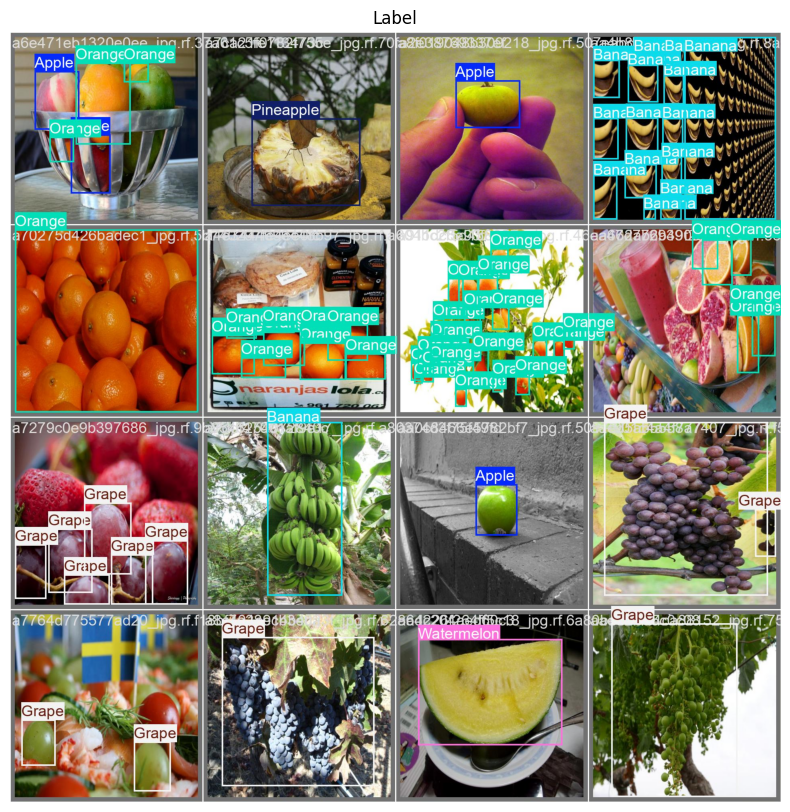

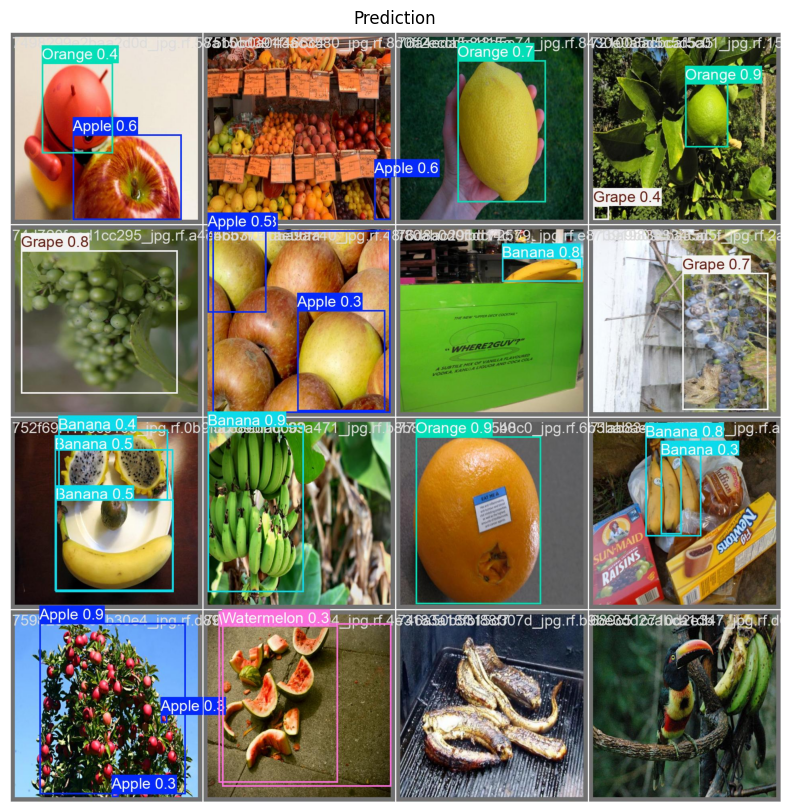

In [24]:
val_label = Image.open("/content/runs/detect/train3/val_batch1_labels.jpg")
val_pred = Image.open("/content/runs/detect/train3/val_batch2_pred.jpg")

plt.figure(figsize=(20,10))
plt.imshow(val_label)
plt.title("Label")
plt.axis(False)
plt.show()

plt.figure(figsize=(20,10))
plt.imshow(val_pred)
plt.title("Prediction")
plt.axis(False)
plt.show()

# save the yolo8 best model

In [25]:
import os
import shutil

results_dir = '/content/runs/detect/train3/weights'
best_model_filename = 'best.pt'

# Path to the best model
best_model_path = os.path.join(results_dir, best_model_filename)

saved_model_dir = '/content/best_model_yolo8'

os.makedirs(saved_model_dir, exist_ok=True)

shutil.copy(best_model_path, os.path.join(saved_model_dir, best_model_filename))

print(f"Best model saved to: {os.path.join(saved_model_dir, best_model_filename)}")


Best model saved to: /content/best_model_yolo8/best.pt


# start config and train YOLO11

### import yolo11 from ultralytics

In [ ]:
from ultralytics import YOLO
model = YOLO("yolo11n.pt")

## configration settings

In [ ]:
import yaml
from pathlib import Path
import wandb
wandb.init(mode='disabled')


data = {
    'train': "/content/fruit-detection/Fruits-detection/train",
    'val': "/content/fruit-detection/Fruits-detection/valid",
    'nc': 6,
    'names' :
        ['Apple',
         'Banana',
         'Grape',
         'Orange',
         'Pineapple',
         'Watermelon' ]
}

with open('dataY11.yaml', 'w') as file:
    yaml.dump(data, file)


## start training

In [ ]:
yolo11_yaml_path='/content/dataY11.yaml'
model.train(data=yolo11_yaml_path, imgsz=600, batch=32, epochs=20)

New https://pypi.org/project/ultralytics/8.3.24 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.21 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/dataY11.yaml, epochs=20, time=None, patience=100, batch=32, imgsz=600, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=Fals

train: Scanning /content/fruit-detection/Fruits-detection/train/labels.cache... 7108 images, 0 backgrounds, 0 corrupt: 100%|██████████| 7108/7108 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/fruit-detection/Fruits-detection/train/images/3d8be4f881b8c54c_jpg.rf.0d7b6d095459cece040b47b246d807af.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/fruit-detection/Fruits-detection/train/images/3d8be4f881b8c54c_jpg.rf.64e869a9bedd5f012cc2a1129c6ca229.jpg: 1 duplicate labels removed


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.20 (you have 1.4.15). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/fruit-detection/Fruits-detection/valid/labels.cache... 914 images, 0 backgrounds, 0 corrupt: 100%|██████████| 914/914 [00:00<?, ?it/s]

val: WARNING ⚠️ /content/fruit-detection/Fruits-detection/valid/images/3d3ddc3054b32eb7_jpg.rf.03e7789aaf5212e2634b84ef502e0832.jpg: 1 duplicate labels removed


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 608 train, 608 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      5.67G      1.065      2.627      1.269         24        608: 100%|██████████| 223/223 [02:22<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:11<00:00,  1.36it/s]


                   all        914       3227      0.309      0.237      0.181     0.0969

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      5.52G       1.02      1.778      1.244         19        608: 100%|██████████| 223/223 [02:13<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:10<00:00,  1.38it/s]


                   all        914       3227      0.352      0.286      0.231       0.13

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      6.23G      1.011       1.62      1.229         50        608: 100%|██████████| 223/223 [02:16<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:09<00:00,  1.61it/s]


                   all        914       3227      0.257      0.247      0.154     0.0878

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      6.19G      1.002       1.53       1.23         25        608: 100%|██████████| 223/223 [02:14<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:10<00:00,  1.37it/s]


                   all        914       3227      0.377      0.329      0.277      0.155

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      5.64G     0.9703      1.384      1.207         32        608: 100%|██████████| 223/223 [02:14<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:09<00:00,  1.61it/s]


                   all        914       3227      0.446      0.338      0.307      0.178

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      5.42G     0.9348      1.301      1.189         40        608: 100%|██████████| 223/223 [02:13<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:08<00:00,  1.83it/s]


                   all        914       3227      0.511      0.336      0.349      0.218

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      5.64G     0.9006      1.221      1.172         34        608: 100%|██████████| 223/223 [02:16<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:10<00:00,  1.38it/s]

                   all        914       3227      0.512      0.344      0.358       0.21



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      5.86G     0.8869      1.177       1.16         22        608: 100%|██████████| 223/223 [02:11<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:09<00:00,  1.59it/s]

                   all        914       3227      0.514      0.384      0.385       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      5.96G      0.877       1.13      1.154         24        608: 100%|██████████| 223/223 [02:14<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:08<00:00,  1.81it/s]


                   all        914       3227      0.515      0.356      0.383      0.243

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      6.52G      0.858      1.085      1.137         17        608: 100%|██████████| 223/223 [02:11<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:10<00:00,  1.43it/s]


                   all        914       3227      0.549      0.386      0.404      0.253
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20       5.7G     0.8818      1.036      1.148          6        608: 100%|██████████| 223/223 [02:11<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:11<00:00,  1.36it/s]


                   all        914       3227      0.539      0.405      0.426      0.272

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      5.22G     0.8466     0.9531      1.123         20        608: 100%|██████████| 223/223 [02:05<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:10<00:00,  1.42it/s]


                   all        914       3227      0.551      0.382      0.406      0.259

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      5.54G       0.83      0.916      1.109         10        608: 100%|██████████| 223/223 [02:10<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:09<00:00,  1.60it/s]

                   all        914       3227      0.561      0.424      0.442      0.293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      5.82G     0.8155     0.8714      1.098          9        608: 100%|██████████| 223/223 [02:06<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:08<00:00,  1.83it/s]

                   all        914       3227      0.584      0.415      0.447      0.293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      4.75G     0.8042     0.8355      1.091         17        608: 100%|██████████| 223/223 [02:13<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:10<00:00,  1.48it/s]


                   all        914       3227      0.582      0.421      0.463      0.309

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      5.53G     0.7915     0.7972      1.082         34        608: 100%|██████████| 223/223 [02:09<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:10<00:00,  1.49it/s]

                   all        914       3227       0.63      0.411      0.475      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      5.26G     0.7768     0.7554      1.073         15        608: 100%|██████████| 223/223 [02:13<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:10<00:00,  1.38it/s]

                   all        914       3227      0.605      0.427       0.47      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      5.08G     0.7589     0.7307       1.06          6        608: 100%|██████████| 223/223 [02:08<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:11<00:00,  1.35it/s]

                   all        914       3227      0.631       0.42      0.481      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      6.39G     0.7484      0.705      1.058         27        608: 100%|██████████| 223/223 [02:11<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:10<00:00,  1.41it/s]

                   all        914       3227      0.613      0.447      0.485      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      5.99G     0.7268      0.673      1.043         11        608: 100%|██████████| 223/223 [02:08<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:10<00:00,  1.40it/s]


                   all        914       3227       0.64      0.456      0.507      0.349

20 epochs completed in 0.801 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 5.5MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.21 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,583,322 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:12<00:00,  1.19it/s]


                   all        914       3227      0.639      0.456      0.507      0.349
                 Apple        188        557      0.676      0.472      0.543      0.377
                Banana        167        390      0.659      0.436      0.503      0.312
                 Grape        199        809      0.609       0.35      0.386      0.265
                Orange        197       1100      0.632      0.413      0.459      0.298
             Pineapple         77        154      0.614      0.442       0.49      0.346
            Watermelon        107        217      0.646      0.627      0.662      0.493
Speed: 0.2ms preprocess, 2.2ms inference, 0.0ms loss, 2.9ms postprocess per image
Results saved to runs/detect/train2


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7bb92e684730>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
     

## yolo11 Evaluation

In [ ]:
model.val(data='/content/dataY11.yaml')

Ultralytics 8.3.21 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,583,322 parameters, 0 gradients, 6.3 GFLOPs


val: Scanning /content/fruit-detection/Fruits-detection/valid/labels.cache... 914 images, 0 backgrounds, 0 corrupt: 100%|██████████| 914/914 [00:00<?, ?it/s]

val: WARNING ⚠️ /content/fruit-detection/Fruits-detection/valid/images/3d3ddc3054b32eb7_jpg.rf.03e7789aaf5212e2634b84ef502e0832.jpg: 1 duplicate labels removed



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 29/29 [00:14<00:00,  2.03it/s]


                   all        914       3227      0.639      0.458      0.507      0.349
                 Apple        188        557      0.673      0.472      0.543      0.377
                Banana        167        390      0.662      0.442      0.503      0.312
                 Grape        199        809      0.611      0.353      0.386      0.265
                Orange        197       1100      0.632      0.413      0.459      0.299
             Pineapple         77        154      0.612      0.442      0.488      0.345
            Watermelon        107        217      0.643      0.627      0.663      0.494
Speed: 0.3ms preprocess, 3.7ms inference, 0.0ms loss, 2.9ms postprocess per image
Results saved to runs/detect/train22


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7bb92e9081f0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
     

## plot some labels vs prediction

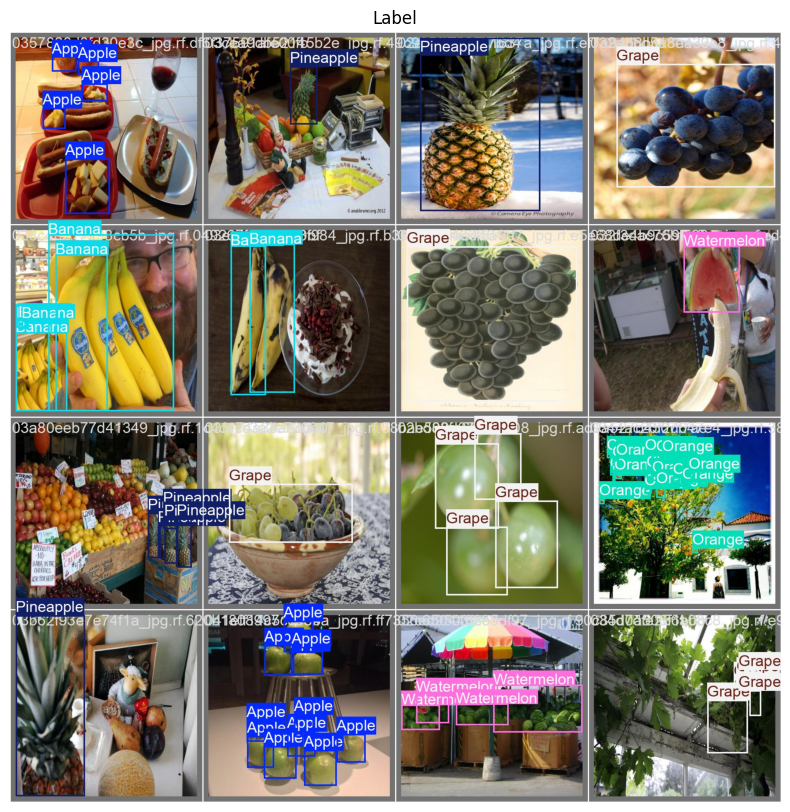

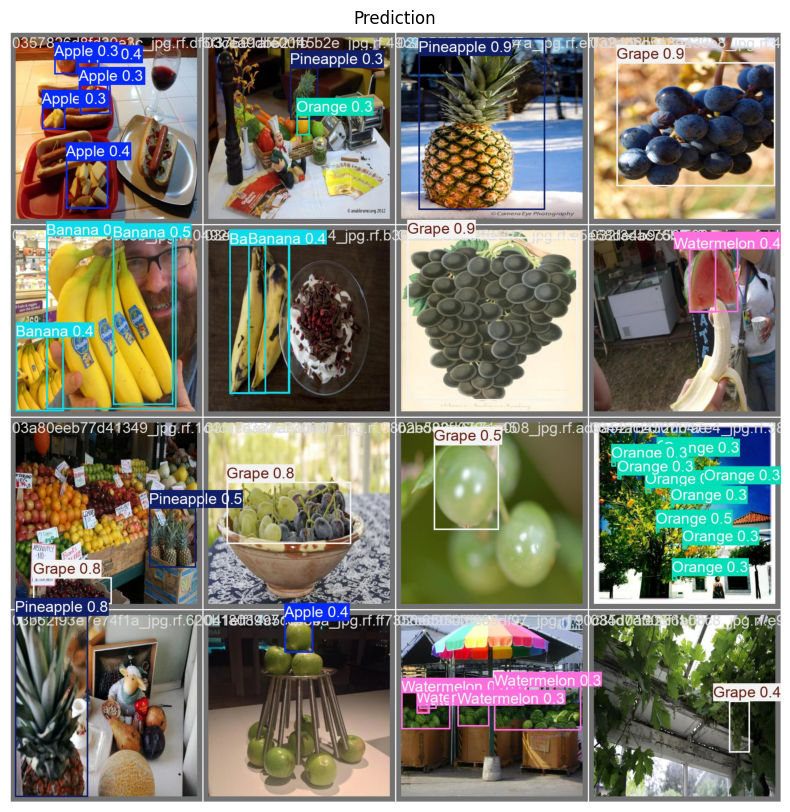

In [ ]:
val_label = Image.open("/content/runs/detect/train32/val_batch1_labels.jpg")
val_pred = Image.open("/content/runs/detect/train32/val_batch1_pred.jpg")

plt.figure(figsize=(20,10))
plt.imshow(val_label)
plt.title("Label")
plt.axis(False)
plt.show()

plt.figure(figsize=(20,10))
plt.imshow(val_pred)
plt.title("Prediction")
plt.axis(False)
plt.show()

# save the Yolo11 best model

In [ ]:
import os
import shutil


results_dir = '/content/runs/detect/train2/weights'
best_model_filename = 'best.pt'

# Path to the best model
best_model_path = os.path.join(results_dir, best_model_filename)

saved_model_dir = '/content/best_model_yolo11'

os.makedirs(saved_model_dir, exist_ok=True)

shutil.copy(best_model_path, os.path.join(saved_model_dir, best_model_filename))

print(f"Best model saved to: {os.path.join(saved_model_dir, best_model_filename)}")


Best model saved to: /content/best_model_yolo11/best.pt


# FasterRCNN

## clone the officaal repo from pytorch

In [ ]:
!git clone https://github.com/sovit-123/fastercnn-pytorch-training-pipeline.git

fatal: destination path 'fastercnn-pytorch-training-pipeline' already exists and is not an empty directory.


## Enter the repo directory.

In [ ]:
%cd fastercnn-pytorch-training-pipeline/

/content/fastercnn-pytorch-training-pipeline


## Install the Requirements

In [ ]:
!pip install -r requirements.txt

## import torch libraries

In [ ]:
import os
import glob
import xml.etree.ElementTree as ET
from xml.dom.minidom import parseString
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import random
import torch
from torch.utils.data import Dataset
from torchvision import transforms

# start with data config steps

## Step 1: Set up directories


In [ ]:
data = '/content/fruit-detection/Fruits-detection'
traindir = os.path.join(data, 'train/images')
trainlabels = os.path.join(data, 'train/labels')
valdir = os.path.join(data, 'valid/images')
vallabels = os.path.join(data, 'valid/labels')



## Step 2: Function to retrieve image and label files and sort them


In [ ]:
def files(images, labels):
    image_files = sorted(glob.glob(os.path.join(images, '*.jpg')))
    labels_files = sorted(glob.glob(os.path.join(labels, '*.txt')))
    return image_files, labels_files


## Step 3: Create Pascal VOC XML from YOLO format labels

In [ ]:

def create_voc_xml(image_path, label_path, class_mapping):
    image = Image.open(image_path)
    width, height = image.size
    filename = os.path.basename(image_path)

    # Create XML structure
    annotation = ET.Element("annotation")
    ET.SubElement(annotation, "folder").text = "images"
    ET.SubElement(annotation, "filename").text = filename

    # Image details
    size = ET.SubElement(annotation, "size")
    ET.SubElement(size, "width").text = str(width)
    ET.SubElement(size, "height").text = str(height)
    ET.SubElement(size, "depth").text = "3"  # Assuming RGB

    # Object details from label file
    with open(label_path, "r") as file:
        for line in file:
            elements = line.strip().split()
            class_id, x_center, y_center, box_width, box_height = map(float, elements)

            # Convert YOLO format to Pascal VOC format
            xmin = int((x_center - box_width / 2) * width)
            xmax = int((x_center + box_width / 2) * width)
            ymin = int((y_center - box_height / 2) * height)
            ymax = int((y_center + box_height / 2) * height)

            # Create object XML entry
            obj = ET.SubElement(annotation, "object")
            ET.SubElement(obj, "name").text = class_mapping[int(class_id)]
            ET.SubElement(obj, "pose").text = "Unspecified"
            ET.SubElement(obj, "truncated").text = "0"
            ET.SubElement(obj, "difficult").text = "0"
            bndbox = ET.SubElement(obj, "bndbox")
            ET.SubElement(bndbox, "xmin").text = str(xmin)
            ET.SubElement(bndbox, "ymin").text = str(ymin)
            ET.SubElement(bndbox, "xmax").text = str(xmax)
            ET.SubElement(bndbox, "ymax").text = str(ymax)

    # Format XML
    xml_str = ET.tostring(annotation)
    xml_pretty = parseString(xml_str).toprettyxml()
    return xml_pretty

## Step 4:  usage - Convert all training labels


In [ ]:
class_mapping = {0: "Apple", 1: "Banana", 2: "Grape", 3: "Orange", 4: "Pineapple", 5: "Watermelon"}  # Adjust class names as per your dataset

image_files, labels_files = files(traindir, trainlabels)
output_dir = "/content/annotations_xml"
os.makedirs(output_dir, exist_ok=True)

for img_path, lbl_path in zip(image_files, labels_files):
    xml_data = create_voc_xml(img_path, lbl_path, class_mapping)
    xml_filename = os.path.join(output_dir, os.path.basename(img_path).replace(".jpg", ".xml"))
    with open(xml_filename, "w") as xml_file:
        xml_file.write(xml_data)

## Step 5: Function to plot images with bounding boxes


In [ ]:
def plot_image_with_boxes(image_path, xml_path):
    image = Image.open(image_path)
    fig, ax = plt.subplots(1)
    ax.imshow(image)

    # Parse XML
    tree = ET.parse(xml_path)
    root = tree.getroot()

    for obj in root.findall('object'):
        name = obj.find('name').text
        bndbox = obj.find('bndbox')
        xmin = int(bndbox.find('xmin').text)
        ymin = int(bndbox.find('ymin').text)
        xmax = int(bndbox.find('xmax').text)
        ymax = int(bndbox.find('ymax').text)

        # Plot bounding box
        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        plt.text(xmin, ymin, name, color='red', fontsize=12, weight='bold')

    plt.show()

## Example usage - Plot sample image with bounding boxes
sample_image = image_files[0]  # Change index as needed
sample_xml = os.path.join(output_dir, os.path.basename(sample_image).replace(".jpg", ".xml"))
plot_image_with_boxes(sample_image, sample_xml)

## Step 6: Convert all validation labels


In [ ]:
val_image_files, val_labels_files = files(valdir, vallabels)
val_output_dir = "/content/annotations_xml_val"
os.makedirs(val_output_dir, exist_ok=True)

for img_path, lbl_path in zip(val_image_files, val_labels_files):
    xml_data = create_voc_xml(img_path, lbl_path, class_mapping)
    xml_filename = os.path.join(val_output_dir, os.path.basename(img_path).replace(".jpg", ".xml"))
    with open(xml_filename, "w") as xml_file:
        xml_file.write(xml_data)

## Step 7: Create a Custom Dataset class


In [ ]:
class CustomDataset(Dataset):
    def __init__(self, image_paths, label_paths, transform=None, draw_box=False):
        self.image_paths = image_paths
        self.label_paths = label_paths
        self.transform = transform
        self.draw_box = draw_box

    def __getitem__(self, index):
        image_path = self.image_paths[index]
        label_path = self.label_paths[index]

        # Open the image
        image = Image.open(image_path)
        image = image.resize((500, 500))  # Resize to a fixed size (500x500)
        draw = ImageDraw.Draw(image)

        # Initialize labels list
        labels = []

        # Parse XML labels
        with open(label_path, 'r') as file:
            lines = file.readlines()

        for line in lines:
            if line.strip():
                # Split line and extract information
                parts = line.strip().split()
                class_num = int(parts[0])
                x_center = float(parts[1])
                y_center = float(parts[2])
                width = float(parts[3])
                height = float(parts[4])

                # Convert YOLO format to bounding box coordinates
                x_min = int((x_center - width / 2) * 500)
                y_min = int((y_center - height / 2) * 500)
                x_max = int((x_center + width / 2) * 500)
                y_max = int((y_center + height / 2) * 500)

                labels.append((class_num, x_min, y_min, x_max, y_max))

                # Draw bounding boxes if specified
                if self.draw_box:
                    draw.rectangle([x_min, y_min, x_max, y_max], outline='red', width=2)
                    draw.text((x_min, y_min), f"{class_mapping[class_num]}", fill='white')

        # Apply transformations if any
        if self.transform:
            image = self.transform(image)

        return image, labels

    def __len__(self):
        return len(self.image_paths)

## Step 8: Create training and validation datasets


In [ ]:
train_transform = transforms.ToTensor()  # Convert images to tensors
train_dataset = CustomDataset(image_files, labels_files, transform=train_transform, draw_box=False)
val_dataset = CustomDataset(val_image_files, val_labels_files, transform=train_transform, draw_box=False)

## Step 9: Show images with bounding boxes from the training dataset

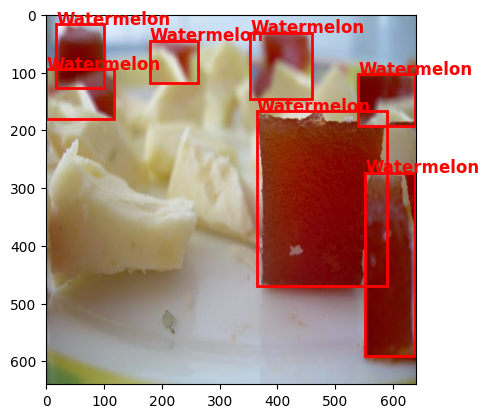

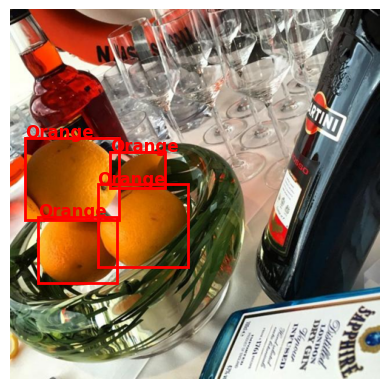

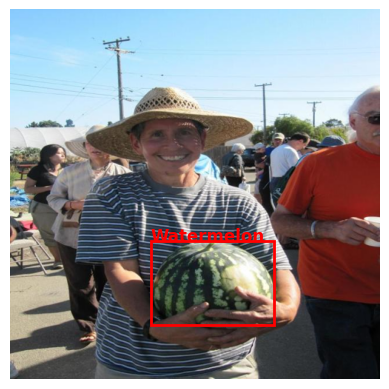

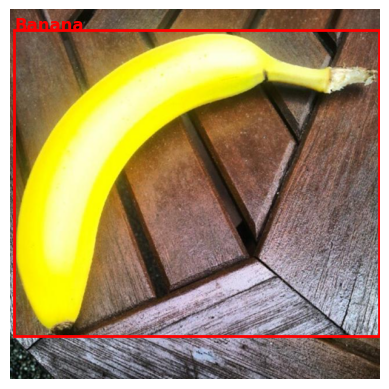

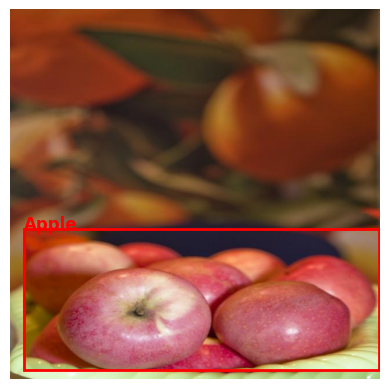

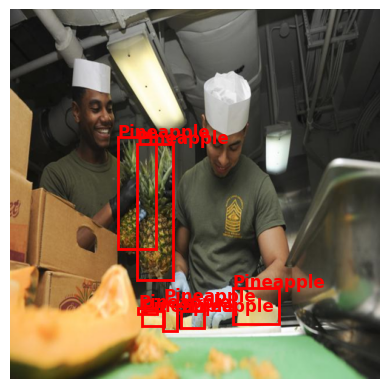

In [ ]:
def show_images_with_boxes(dataset, num_images=5):
    """
    Display images with bounding boxes.
    Args:
        dataset (CustomDataset): The dataset containing images and labels.
        num_images (int): Number of images to display.
    """
    indices = random.sample(range(len(dataset)), num_images)

    for idx in indices:
        image, labels = dataset[idx]
        plt.imshow(image.permute(1, 2, 0).numpy())  # Convert to HWC format

        ax = plt.gca()
        for label in labels:
            class_num, x_min, y_min, x_max, y_max = label
            rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=2, edgecolor='r', facecolor='none')
            ax.add_patch(rect)
            plt.text(x_min, y_min, class_mapping[class_num], color='red', fontsize=12, weight='bold')

        plt.axis('off')
        plt.show()

#  usage - Show images with bounding boxes from the training dataset
show_images_with_boxes(train_dataset, num_images=5)


#create the custom yaml file

In [ ]:
%%writefile /content/datacustomconfig/custom_data.yaml
# Images and labels directory should be relative to train.py
TRAIN_DIR_IMAGES: '/content/fruit-detection/Fruits-detection/train/images'
TRAIN_DIR_LABELS: '/content/annotations_xml'
VALID_DIR_IMAGES: '/content/fruit-detection/Fruits-detection/valid/images'
VALID_DIR_LABELS: '/content/annotations_xml_val'

# Class names.
CLASSES: [
    '__background__',
    'Apple', 'Banana', 'Grape',
    'Orange', 'Pineapple', 'Watermelon'
]

# Number of classes (object classes + 1 for background class in Faster R-CNN).
NC: 7

# Whether to save the predictions of the validation set while training.
SAVE_VALID_PREDICTION_IMAGES: True


Writing /content/datacustomconfig/custom_data.yaml


# Training and validation

In [ ]:
!python /content/fastercnn-pytorch-training-pipeline/train.py --data /content/datacustomconfig/custom_data.yaml --epochs 5 --model fasterrcnn_resnet50_fpn_v2 --name custom_training --batch 8


Not using distributed mode
wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: 3
wandb: You chose "Don't visualize my results"
wandb: Tracking run with wandb version 0.18.5
wandb: W&B syncing is set to `offline` in this directory.  
wandb: Run `wandb online` or set WANDB_MODE=online to enable cloud syncing.
device cuda
Checking Labels and images...
100% 7108/7108 [00:01<00:00, 6557.57it/s]
Removed 0 problematic images and annotations.
Checking Labels and images...
100% 914/914 [00:00<00:00, 12840.37it/s]
Removed 0 problematic images and annotations.
Creating data loaders
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than wh

##Plot som results

In [ ]:
import matplotlib.pyplot as plt
import glob as glob


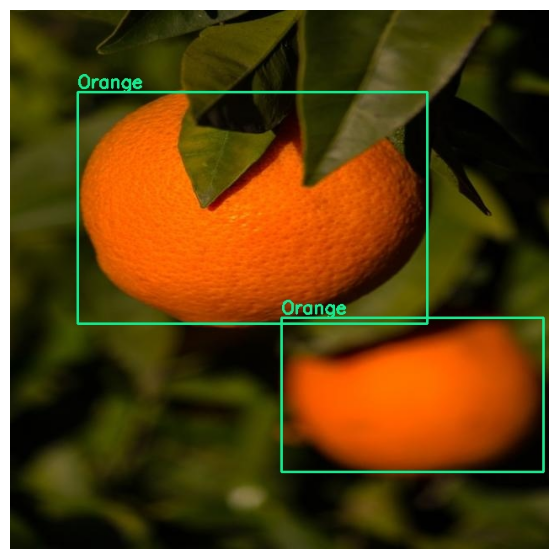

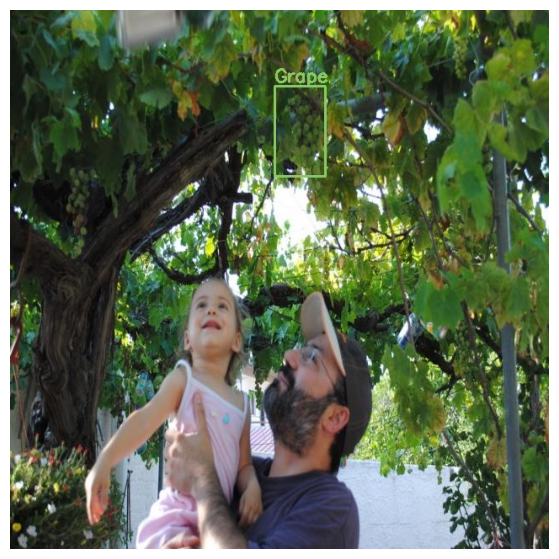

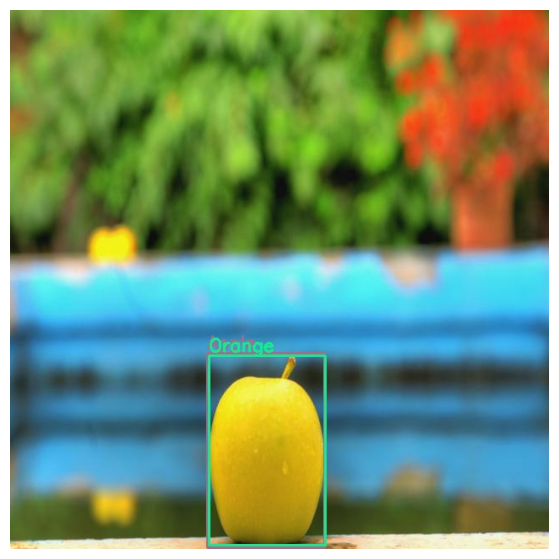

In [ ]:
results_dir_path = '/content/fastercnn-pytorch-training-pipeline/outputs/training/custom_training'
valid_images = glob.glob(f"{results_dir_path}/*.jpg")

for i in range(3):
    plt.figure(figsize=(10, 7))
    image = plt.imread(valid_images[i])
    plt.imshow(image)
    plt.axis('off')
    plt.show()

# Evaluaton (wiht and wihtout verbos)

In [ ]:
# No verbose mAP.
!python /content/fastercnn-pytorch-training-pipeline/eval.py --weights outputs/training/custom_training/best_model.pth --data /content/datacustomconfig/custom_data.yaml --model fasterrcnn_resnet50_fpn_v2

/content/fastercnn-pytorch-training-pipeline/eval.py:120: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(args['weights'], map_location=DEVICE)
Checkin

In [ ]:
#verbose mAP.
!python /content/fastercnn-pytorch-training-pipeline/eval.py --weights outputs/training/custom_training/best_model.pth --data /content/datacustomconfig/custom_data.yaml --model fasterrcnn_resnet50_fpn_v2 --verbose

/content/fastercnn-pytorch-training-pipeline/eval.py:120: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(args['weights'], map_location=DEVICE)
Checkin